ECE 792 - Midterm Spring 2023

Problem 3 - Conditional GAN on MNIST

Submitted by - Surya Dutta (SID: 200481187)

In [3]:
# Prevent the Colab session from disconnecting
from IPython.display import Javascript
from google.colab import output

def prevent_colab_timeout():
    display(Javascript('''
        function ClickConnect(){
            console.log("Working");
            document.querySelector("colab-toolbar-button#connect").click()
        }
        setInterval(ClickConnect,60000)
        '''))
output.register_callback('prevent_colab_timeout', prevent_colab_timeout)


In [4]:
# Import all the necessary libraries
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import IPython
from torch.utils.tensorboard import SummaryWriter
import os

In [ ]:
#from google.colab import drive
#drive.mount('/content/gdrive')

In [5]:
# Define Hyperparameters
z_dim = 64 # Dimension of Z noise vector
epochs = 100 # Number of epochs
step = 500 # Display step interval size
batch_size = 128 # Batch size
lr = 0.0002 # Learning Rate  
classes = 10 # Number of classes in MNIST 
mnist_shape = (1, 28, 28)
device = 'cpu'

In [ ]:
# Define the checkpoint directory to save the model every few epochs
checkpoint_dir_gen = '/content/drive/MyDrive/Checkpoints_Gen/'
checkpoint_dir_disc = '/content/drive/MyDrive/Checkpoints_Disc/'

In [6]:
# Normalise the input [0,1]
transform = transforms.Compose([
    transforms.ToTensor(), # Convert ndarray to tensor
    transforms.Normalize((0.5,), (0.5,)),
])

# Define the dataloader
dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [7]:
# Generator Class
class Generator(nn.Module):
  
  def __init__(self, input=10):
        super(Generator, self).__init__()
        self.input = input
        # Define the transpose conv layers
        self.gen = nn.Sequential(
        nn.ConvTranspose2d(input, out_channels=64, kernel_size=3, stride=2, padding=0),
        nn.Tanh(),
        nn.ConvTranspose2d(in_channels=64, out_channels=128, kernel_size=4, stride=1, padding=0),
        nn.Tanh(),
        nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=0),
        nn.Tanh(),
        nn.ConvTranspose2d(in_channels=64, out_channels=1, kernel_size=4, stride=2, padding=0),
        # Batch normalization on the output of the last conv layer
        nn.BatchNorm2d(1),
        nn.ReLU(inplace=True)
        )

  def forward(self, noise):
          # Forward pass 
          x = noise.view(len(noise), self.input, 1, 1) # Return generated images from input noise tensor
          return self.gen(x)

In [8]:
# Discriminator Class
class Discriminator(nn.Module):
    
    def __init__(self, im_chan = 1):
        super(Discriminator, self).__init__()
        # Define the conv layers
        self.disc = nn.Sequential(
        nn.Conv2d(im_chan, out_channels=64, kernel_size=4, stride=2, padding=0),
        nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=0),
        nn.Conv2d(in_channels=128, out_channels=1, kernel_size=4, stride=2, padding=0),
        # Batch normalization on the output of the last conv layer
        nn.BatchNorm2d(1),
        nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, image):    
        # Returns a 1D tensor representing fake/real given an image tensor
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [9]:
def get_input_dim(z_dim, mnist_shape, classes):
    # Returns the size of the conditional input dimensions
    gen_input = z_dim + classes # 64+10
    discriminator_im_chan = mnist_shape[0] + classes # 11*28*28
    return gen_input, discriminator_im_chan

def get_one_hot_vectors(labels, classes):
    # Returns the one-hot vector which represents the class C
    return F.one_hot(labels, classes)

def get_noise(n_samples, input, device=device):
    # Returns noise vector with random numbers
    # Number of samples = 128, input = 10
    return torch.randn(n_samples, input, device=device)
  
def plot_imgs(img_tensor, num_images=25, size=(1, 28, 28), row=5, show=True):
    # Plot images in the 5*5 uniform grid
    img_tensor = (img_tensor + 1) / 2
    img_unflat = img_tensor.detach().cpu()
    imgrid = make_grid(img_unflat[:num_images], nrow=row)
    plt.imshow(imgrid.permute(1, 2, 0).squeeze(), cmap='gray')
    if show:
        plt.show()

def add_vec(x, y):
    combined = torch.cat((x,y),dim=1) # Concatenate noise vector with the one-hot vector which represents the class C
    return combined

# Initialize weights of the conv layers instead of starting with random values, so that the network can converge faster
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02) # Initialize weights with normal distribution with mu = 0 and std deviation = 0.02 
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0) # Set biases to 0

In [10]:
# Initialize the GAN architecture

# Get generator input and discriminator input channels 
gen_input, discriminator_im_chan = get_input_dim(z_dim, mnist_shape, classes)

# Define the generator
gen = Generator(input=gen_input).to(device)

# Generator Optimization
gen_optim = torch.optim.Adam(gen.parameters(), lr=lr)

# Define the discriminator
disc = Discriminator(im_chan=discriminator_im_chan).to(device)

# Discriminator Optimization
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

# Initialize and apply the weights for the first epoch
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 0.6923905920982361, discriminator loss: 0.6919161956310272


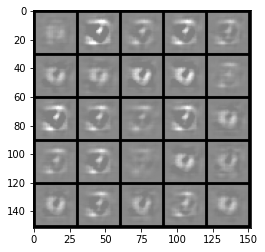

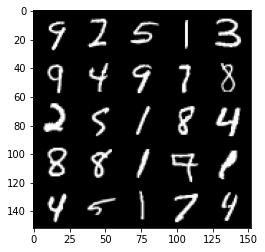

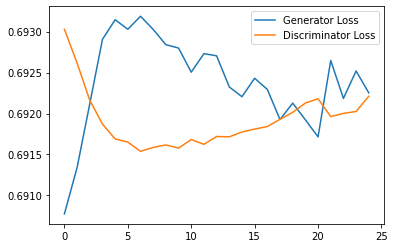

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 0.6941263083219528, discriminator loss: 0.6927296476364135


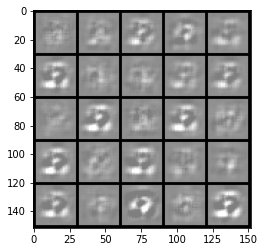

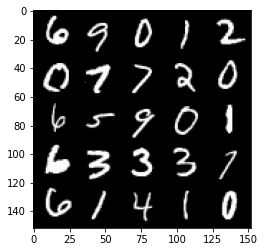

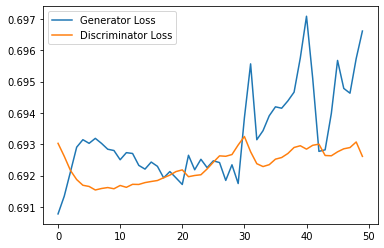

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 0.697650642156601, discriminator loss: 0.6929378806352615


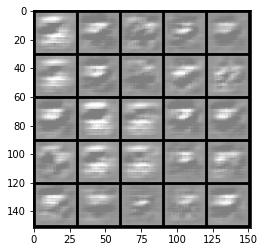

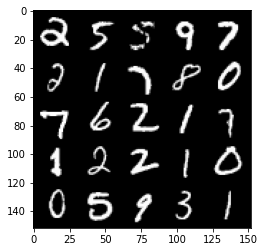

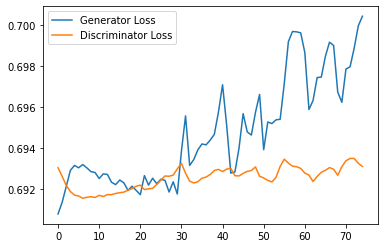

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 0.6985937600135803, discriminator loss: 0.6931644814014435


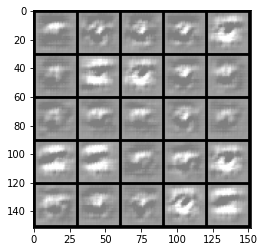

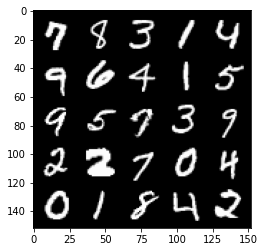

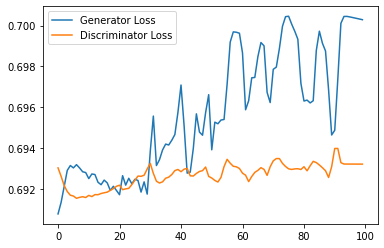

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 0.6998255183696747, discriminator loss: 0.6932053452730179


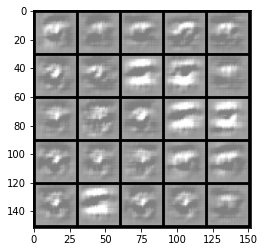

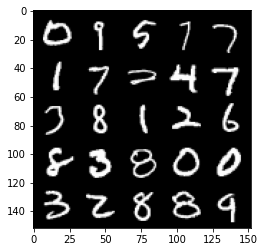

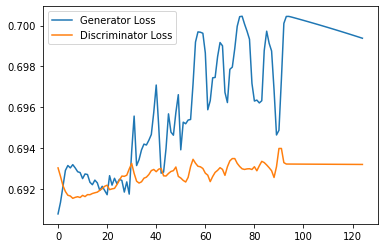

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 0.6988563666343689, discriminator loss: 0.6931895298957824


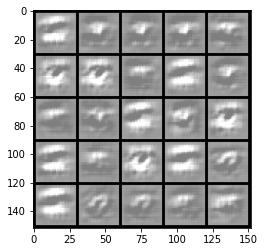

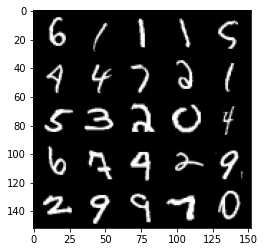

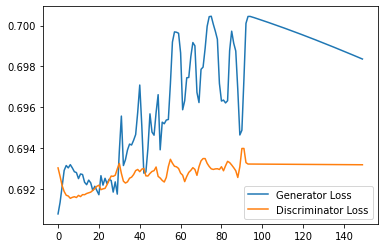

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 0.6978026828765869, discriminator loss: 0.6931752133369445


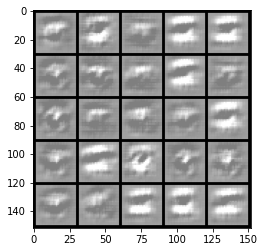

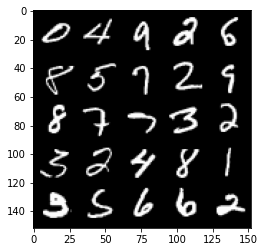

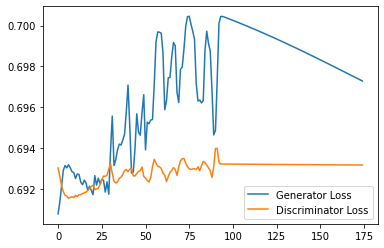

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 0.6967241767644882, discriminator loss: 0.6931636377573013


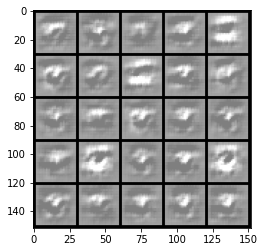

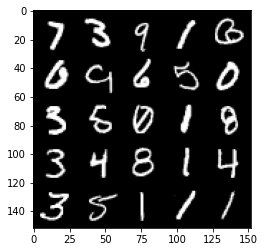

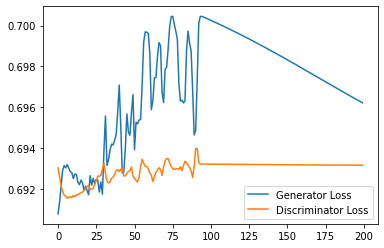

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 0.6956956802606583, discriminator loss: 0.6931554845571518


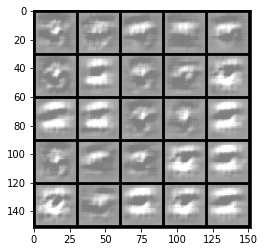

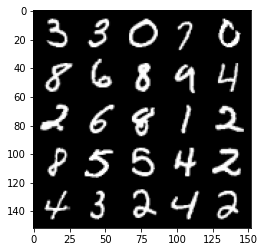

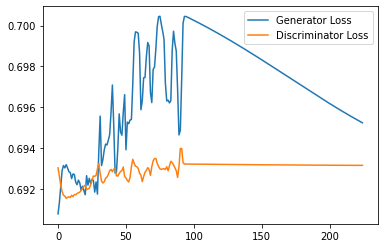

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 0.6947962058782577, discriminator loss: 0.6931506352424621


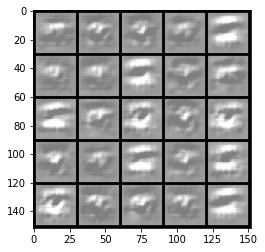

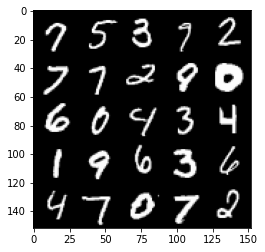

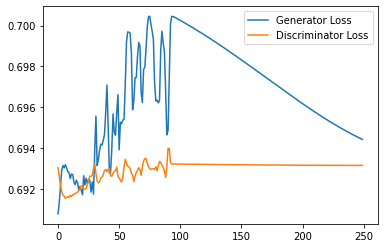

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 0.6940903767347336, discriminator loss: 0.6931483060121536


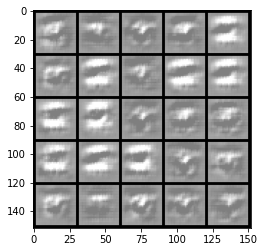

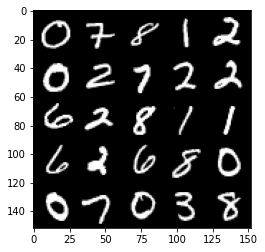

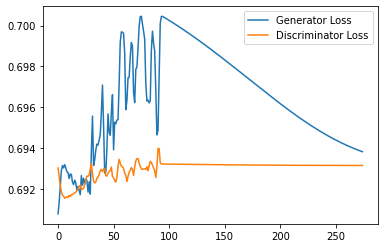

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 0.6936076539754867, discriminator loss: 0.6931474469900131


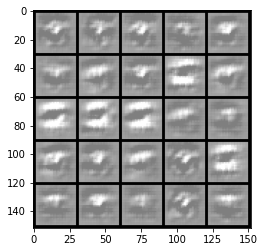

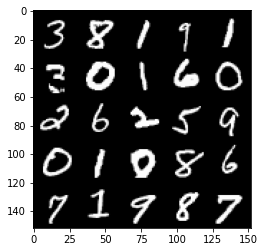

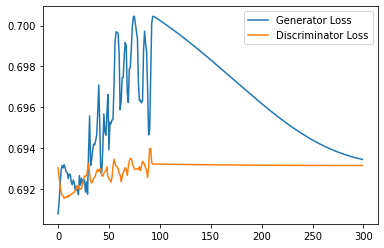

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 0.6933306046724319, discriminator loss: 0.6931472285985947


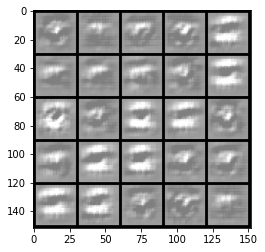

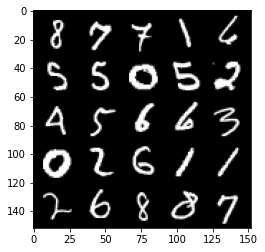

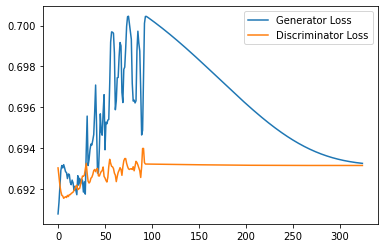

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 0.6932034361362457, discriminator loss: 0.6931471854448319


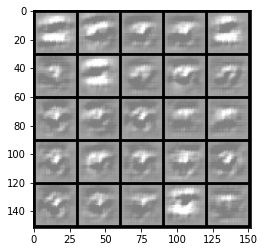

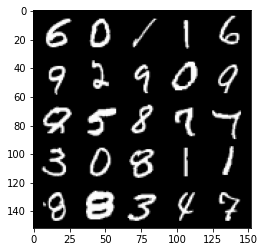

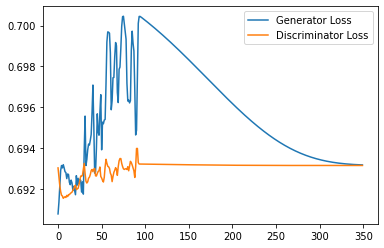

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 0.6931595565080643, discriminator loss: 0.6931471811532974


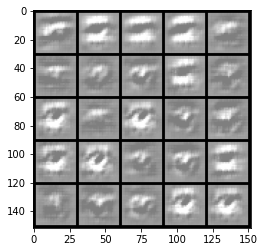

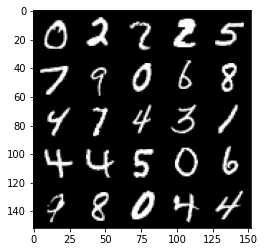

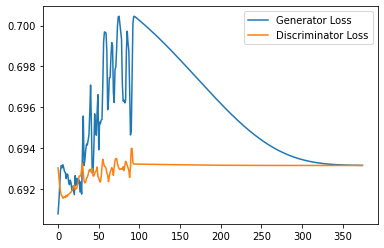

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 0.6931487435102462, discriminator loss: 0.6931471823453903


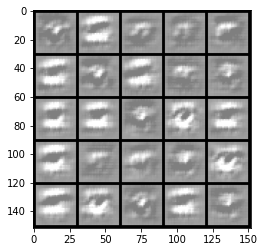

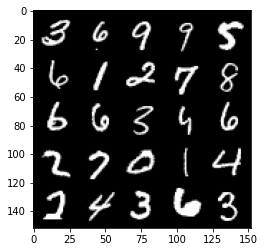

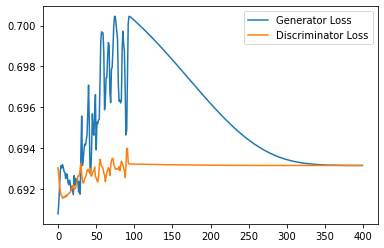

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 0.6931474443674087, discriminator loss: 0.6931471755504608


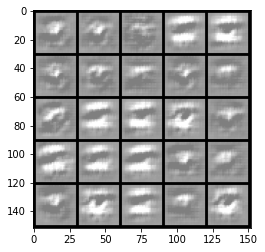

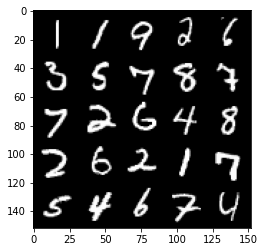

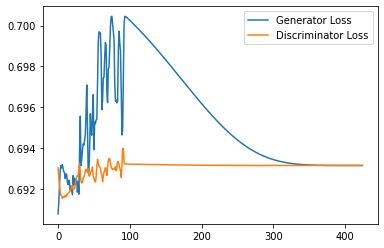

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 0.6931473743915558, discriminator loss: 0.6931471829414367


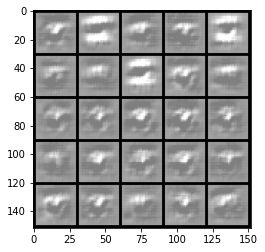

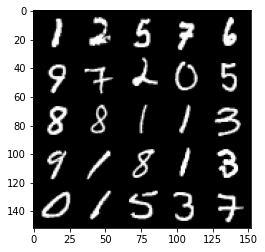

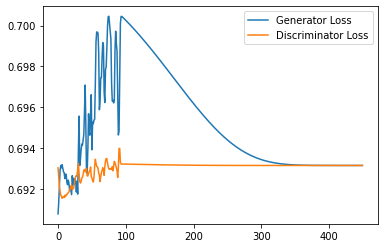

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 0.6931473751068116, discriminator loss: 0.6931471844911575


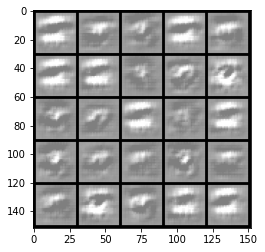

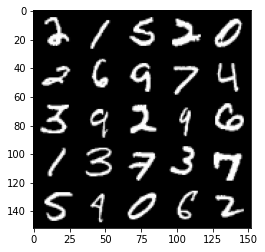

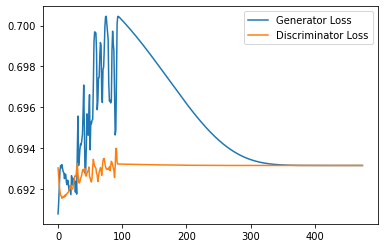

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 0.6931473690271378, discriminator loss: 0.6931471843719482


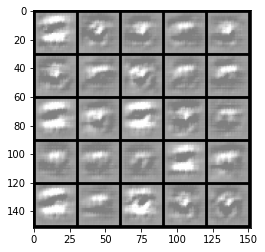

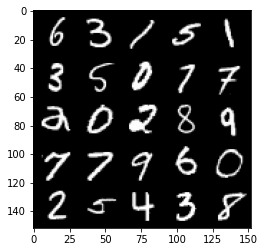

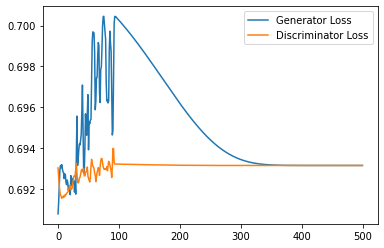

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 0.6931473622322083, discriminator loss: 0.693147183418274


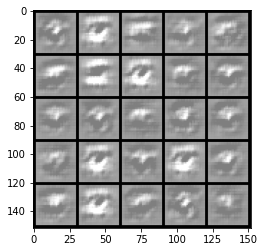

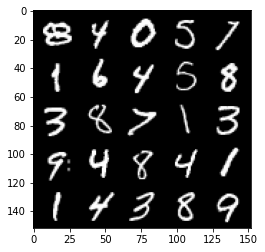

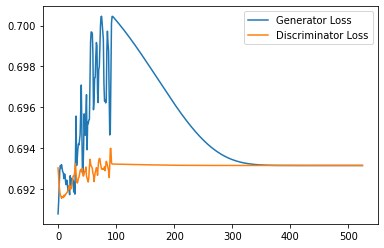

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 0.6931473760604858, discriminator loss: 0.693147217988968


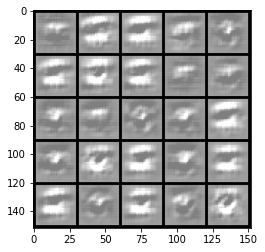

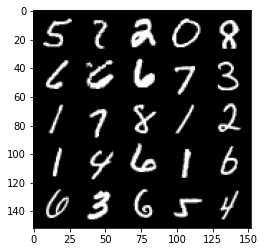

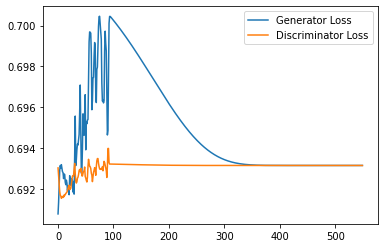

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 0.6931473443508148, discriminator loss: 0.6931472191810608


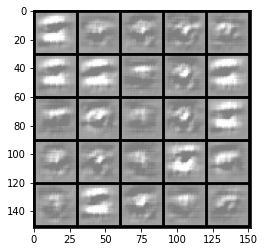

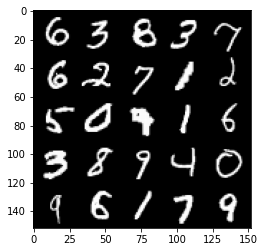

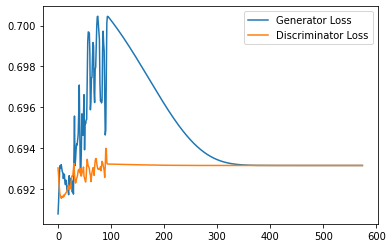

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 0.6931473017930985, discriminator loss: 0.6931471824645996


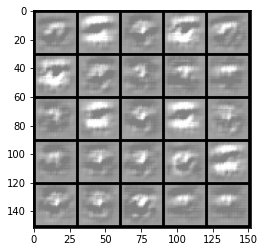

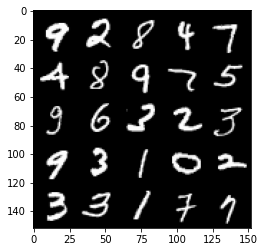

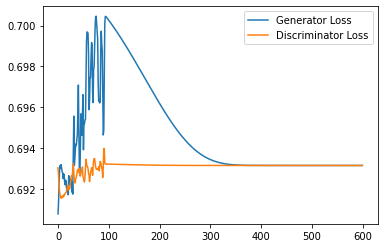

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 0.6931473017930985, discriminator loss: 0.6931471824645996


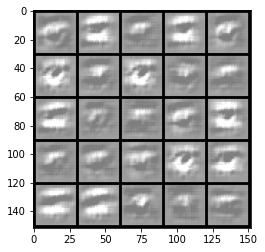

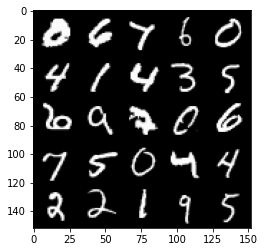

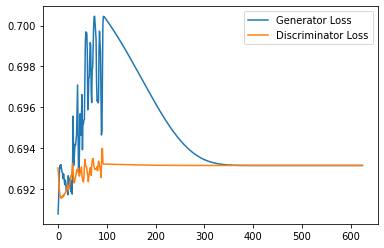

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 0.6931473017930985, discriminator loss: 0.6931471824645996


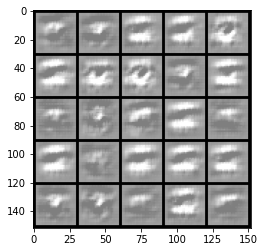

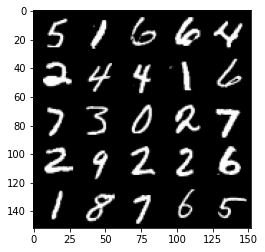

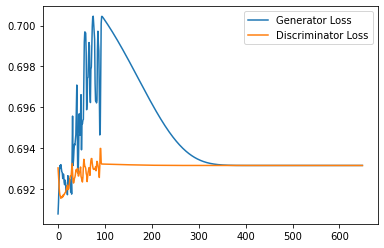

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 0.6931472969055176, discriminator loss: 0.6931471824645996


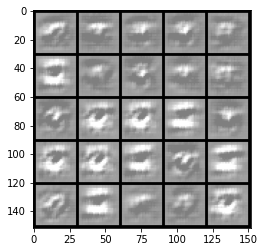

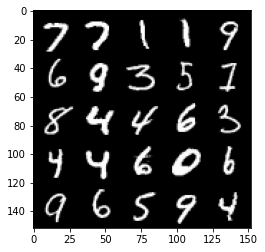

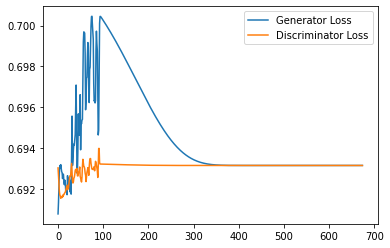

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 0.6931472560167312, discriminator loss: 0.6931471824645996


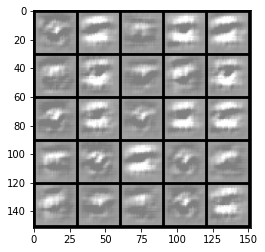

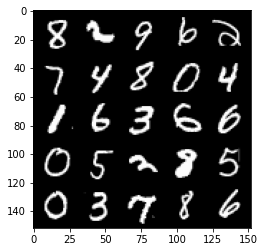

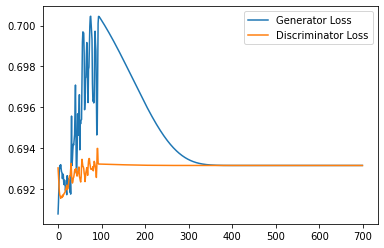

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 0.6931472438573837, discriminator loss: 0.6931471824645996


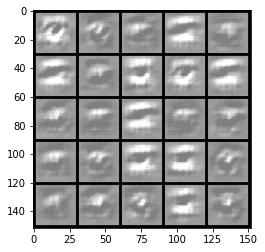

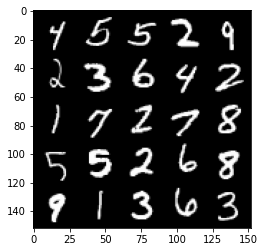

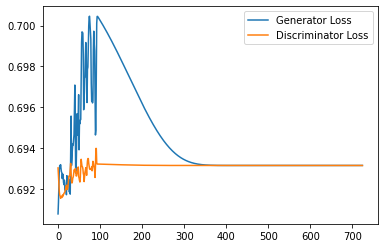

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 0.693147242307663, discriminator loss: 0.6931471824645996


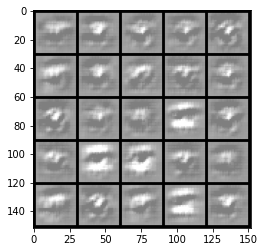

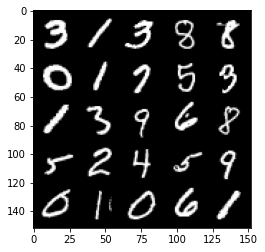

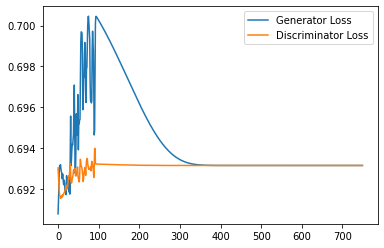

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 0.6955517933368683, discriminator loss: 0.6931125603914261


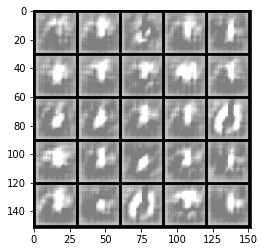

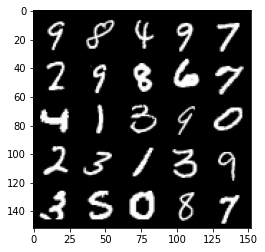

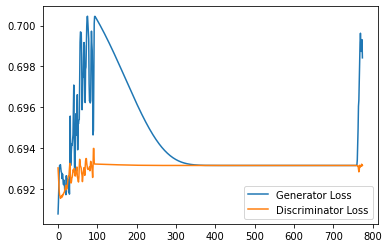

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 0.6980056060552597, discriminator loss: 0.6931642128229141


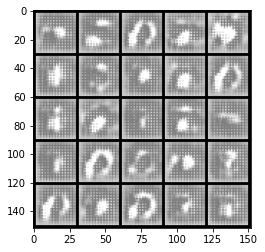

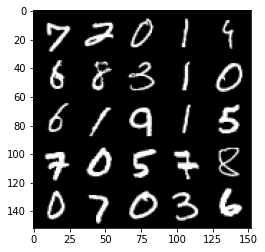

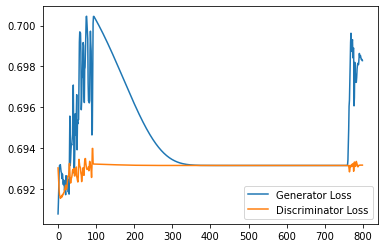

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 0.6975392261743546, discriminator loss: 0.6931593264341355


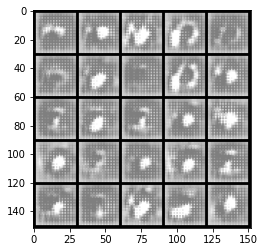

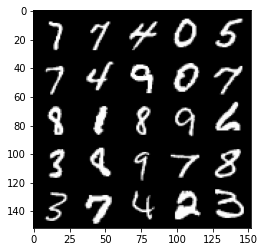

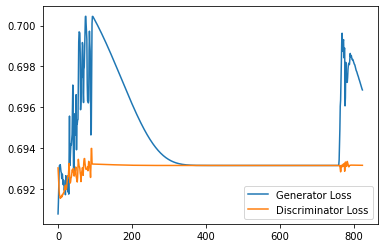

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 0.6961468933820725, discriminator loss: 0.6931528424024582


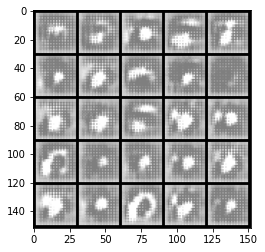

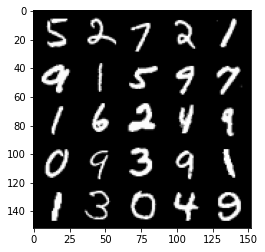

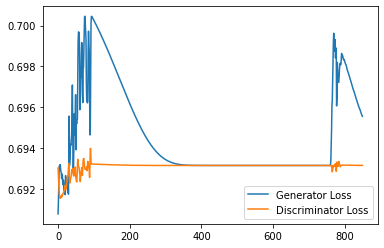

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 0.6949902814626694, discriminator loss: 0.693149325966835


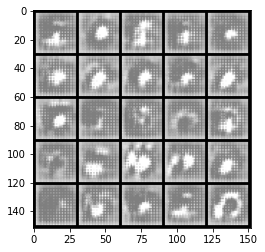

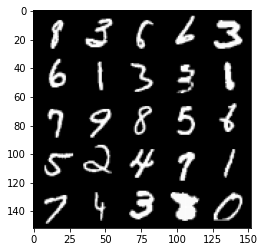

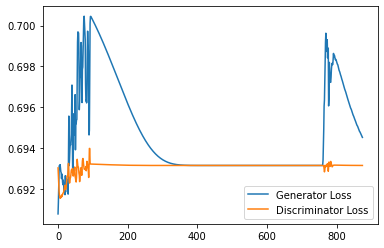

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 0.694133003115654, discriminator loss: 0.6931478058099747


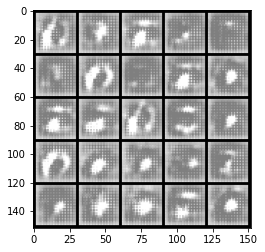

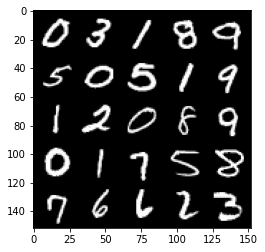

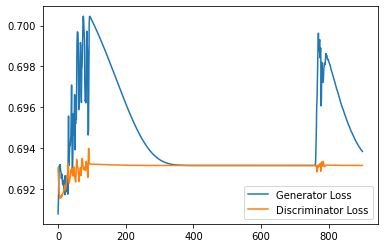

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 0.6935983806848526, discriminator loss: 0.6931473109722137


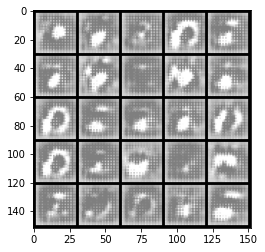

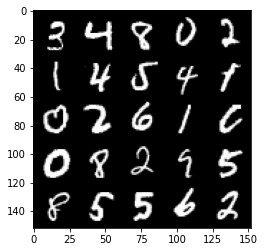

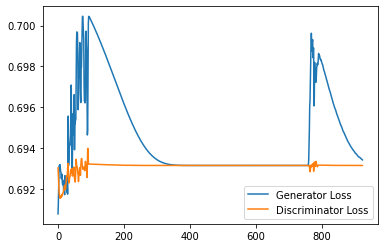

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 0.6933137279748917, discriminator loss: 0.6931471968889237


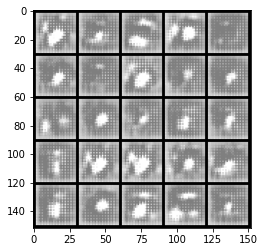

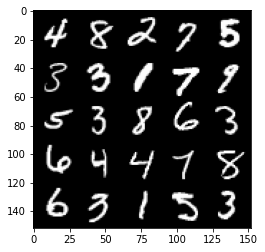

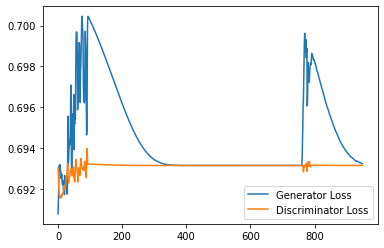

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 0.693230518579483, discriminator loss: 0.6931471860408783


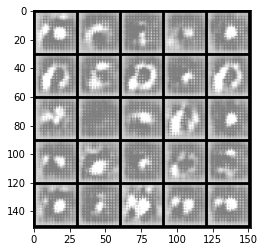

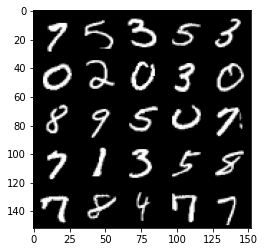

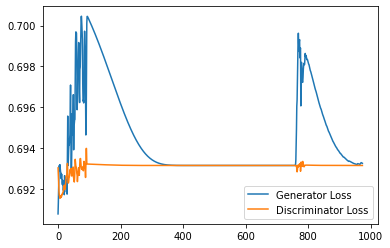

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 0.6931888229846954, discriminator loss: 0.6931471836566925


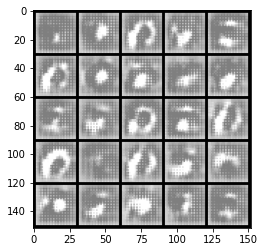

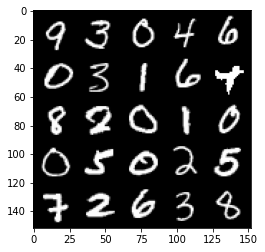

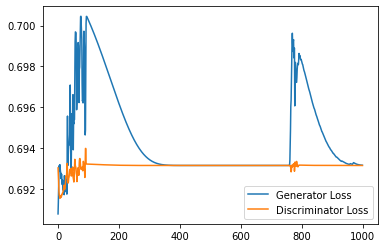

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 0.6934401339292526, discriminator loss: 0.6931472475528717


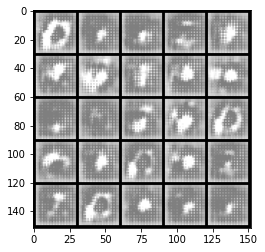

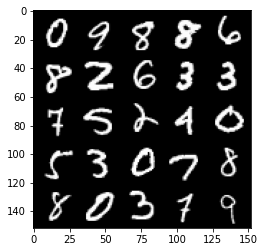

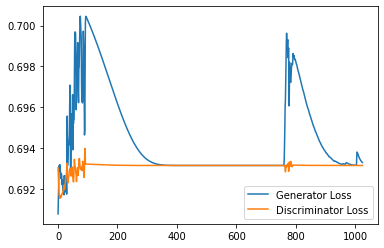

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 0.6931959646940231, discriminator loss: 0.693147183060646


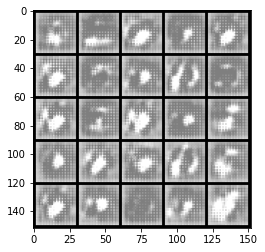

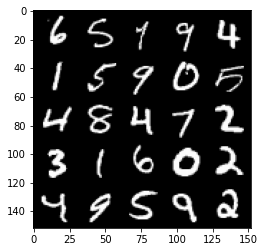

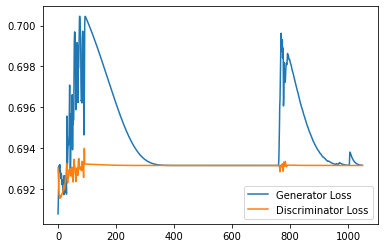

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 0.693396430850029, discriminator loss: 0.6931475768089295


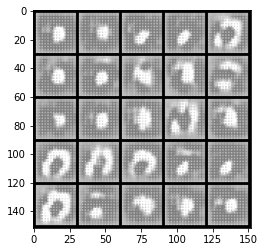

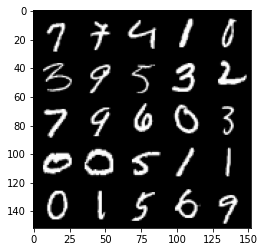

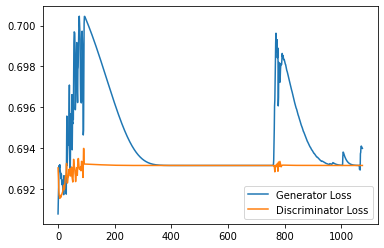

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 0.6936801577806473, discriminator loss: 0.693147351026535


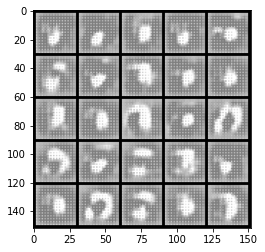

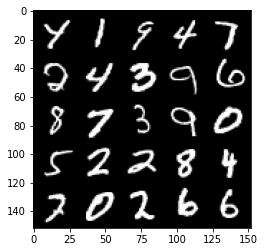

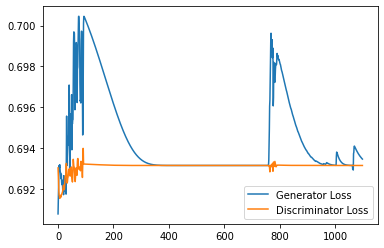

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 0.6933245068788528, discriminator loss: 0.6931471977233886


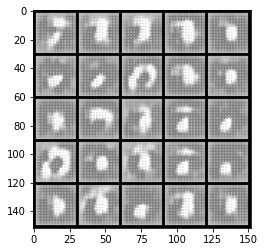

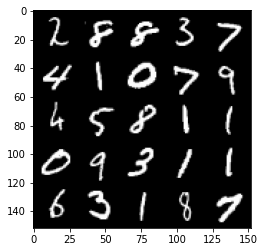

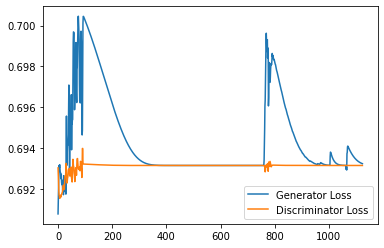

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 0.6928238501548767, discriminator loss: 0.6931437435150146


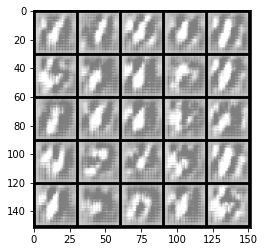

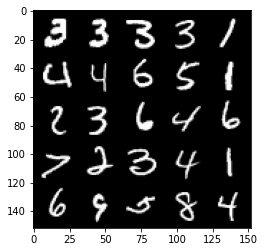

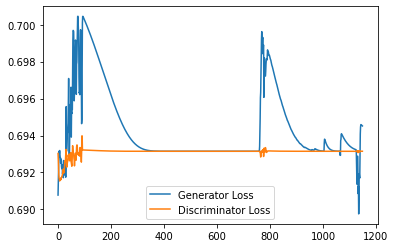

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 0.6943278048038483, discriminator loss: 0.6931478869915009


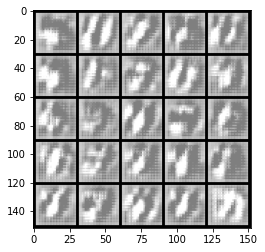

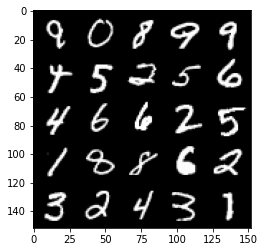

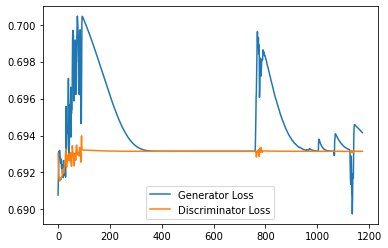

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 0.6939812239408493, discriminator loss: 0.6931475353240967


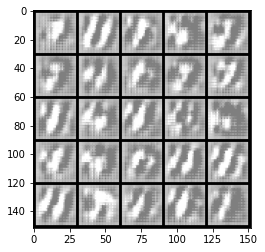

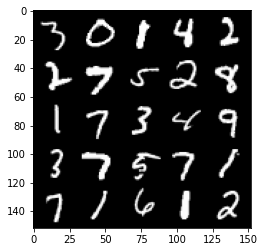

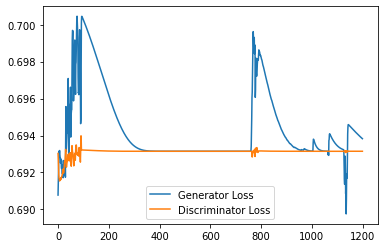

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 0.6936811242103577, discriminator loss: 0.6931473277807235


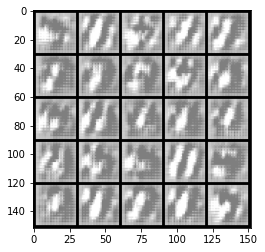

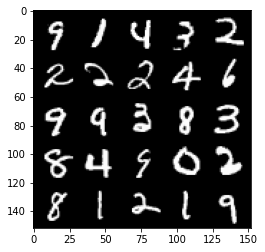

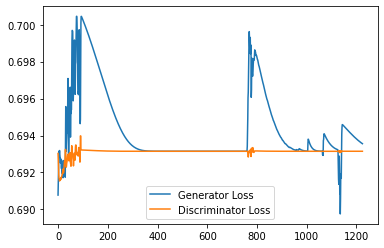

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 0.6934484031200409, discriminator loss: 0.6931472194194793


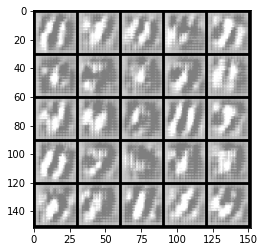

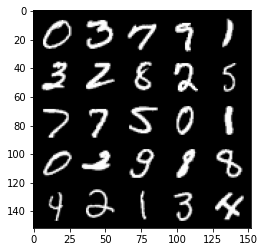

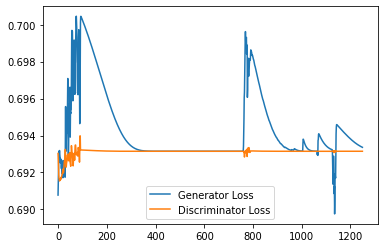

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 0.6932916603088379, discriminator loss: 0.6931471965312958


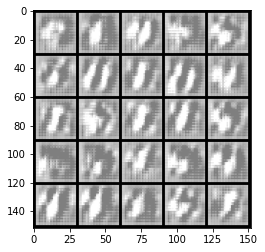

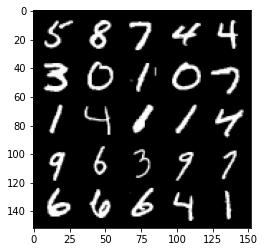

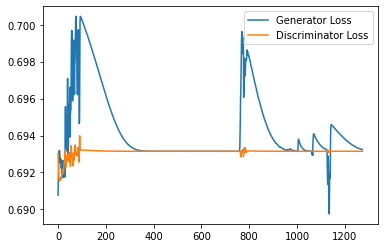

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 0.6932034373283387, discriminator loss: 0.693147183418274


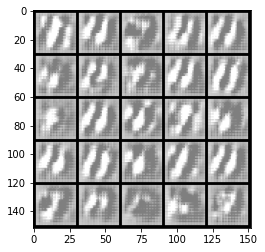

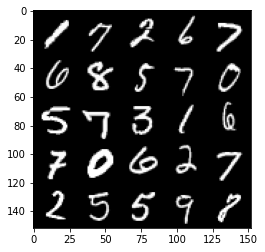

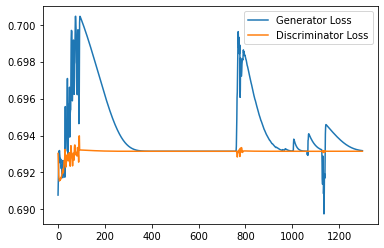

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 0.6931639355421066, discriminator loss: 0.6931471836566925


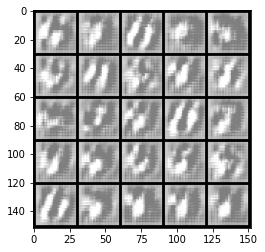

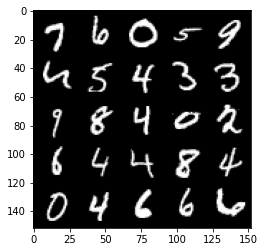

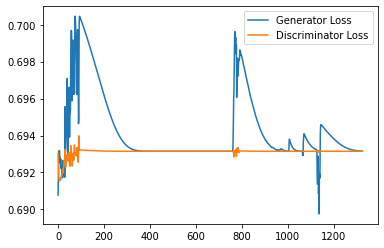

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 0.6931506975889206, discriminator loss: 0.6931471825838089


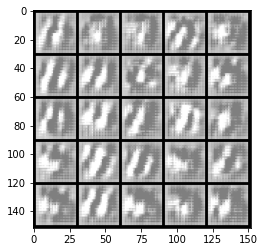

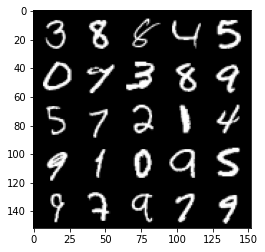

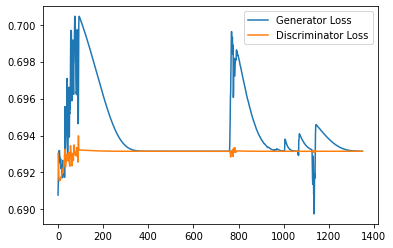

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 0.6931477655172348, discriminator loss: 0.693147182226181


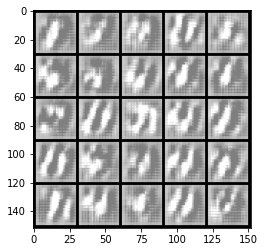

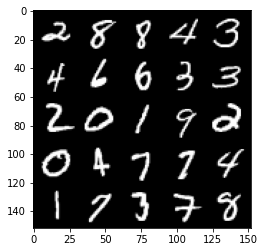

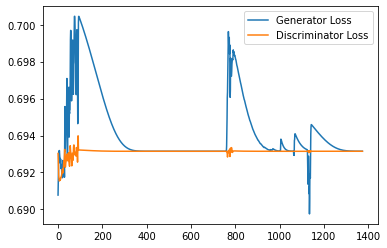

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 0.6931475402116776, discriminator loss: 0.6931471827030182


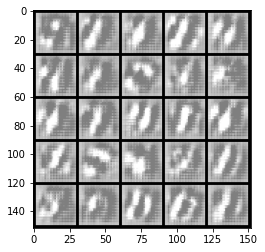

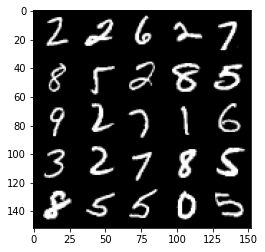

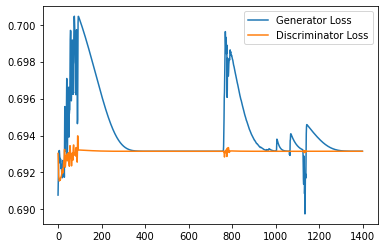

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 0.6931475402116776, discriminator loss: 0.6931471827030182


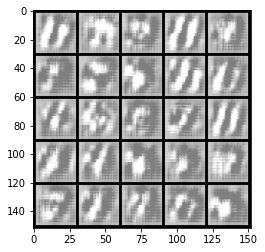

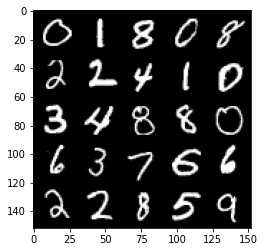

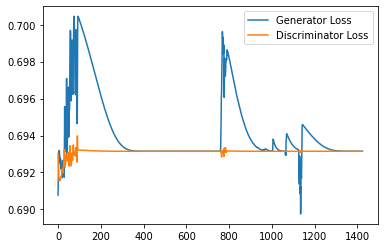

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 0.6931475402116776, discriminator loss: 0.6931471827030182


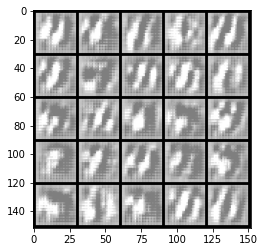

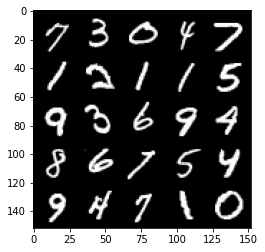

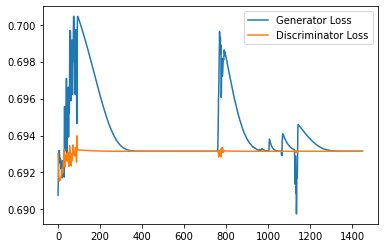

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 0.6931475402116776, discriminator loss: 0.6931471827030182


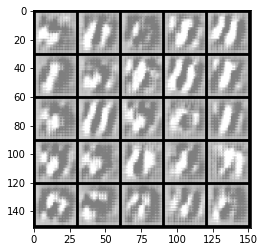

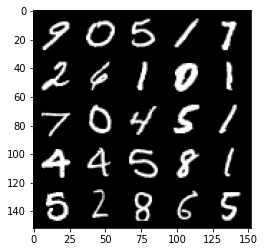

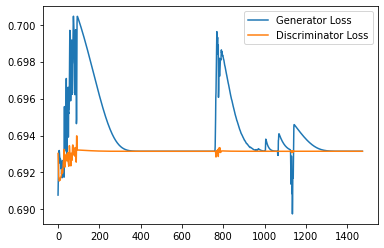

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 0.6931475137472153, discriminator loss: 0.6931471965312958


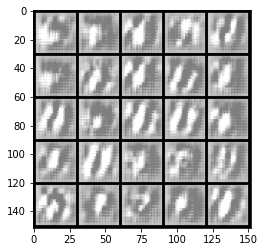

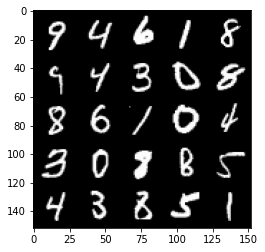

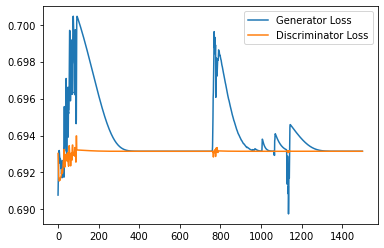

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 0.6931474467515946, discriminator loss: 0.6931471905708313


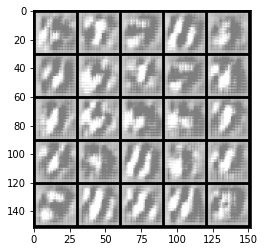

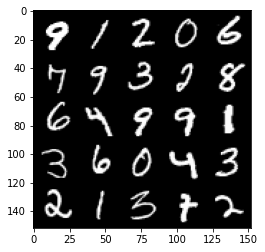

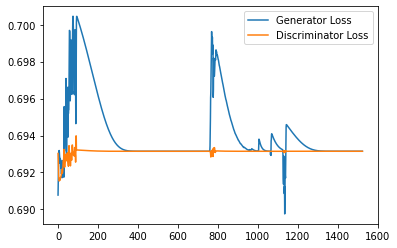

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 0.6931474311351776, discriminator loss: 0.6931471847295761


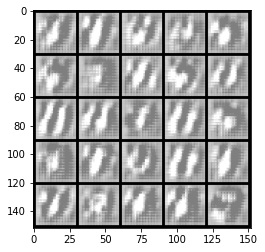

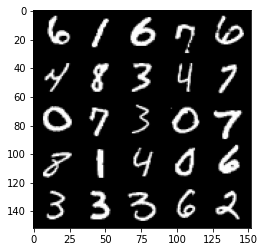

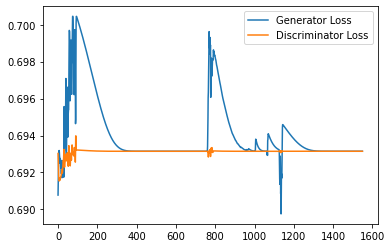

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 0.6931474487781525, discriminator loss: 0.6931471930742263


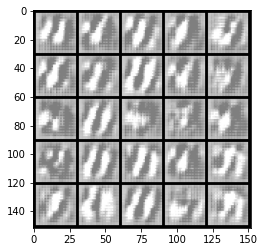

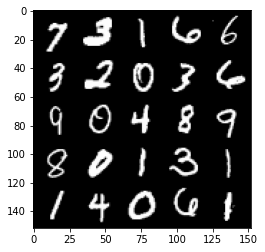

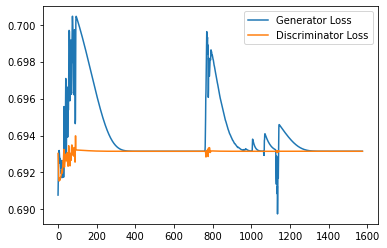

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 0.6931474208831787, discriminator loss: 0.6931471824645996


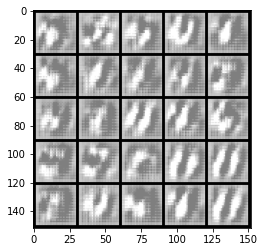

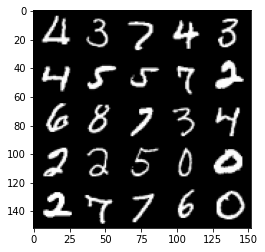

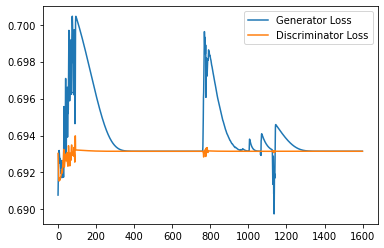

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 0.6931474207639694, discriminator loss: 0.6931471824645996


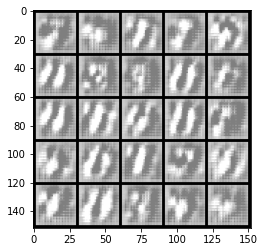

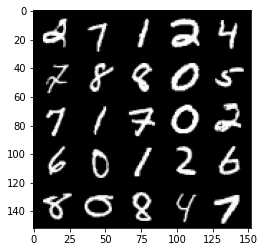

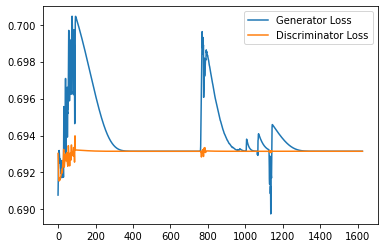

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 0.6931474159955978, discriminator loss: 0.6931471817493439


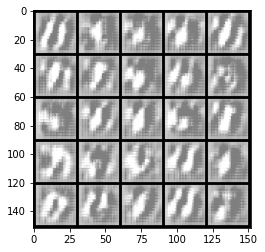

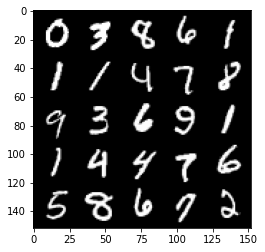

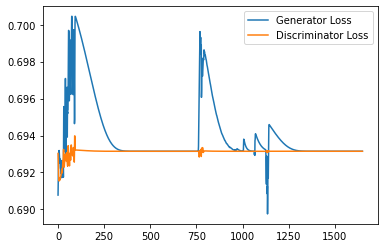

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 0.6931473869085312, discriminator loss: 0.69314717233181


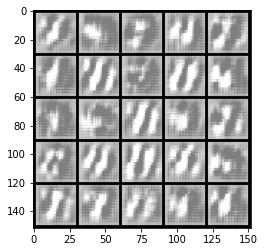

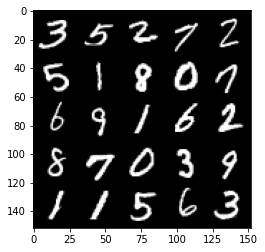

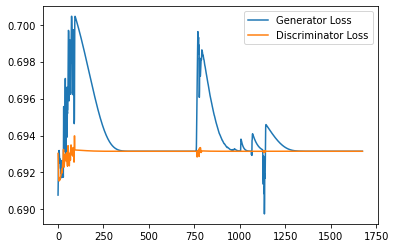

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 0.6931473543643951, discriminator loss: 0.6931471661329269


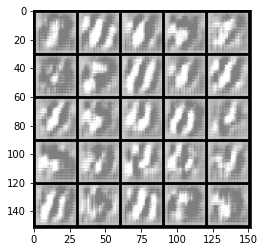

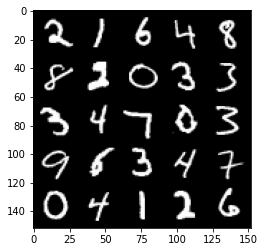

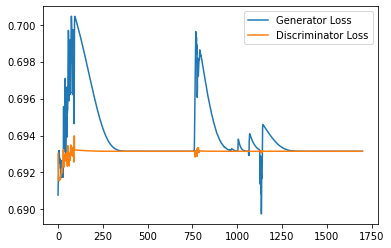

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 0.6931473058462143, discriminator loss: 0.6931471700668335


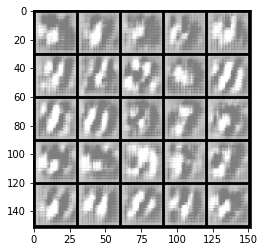

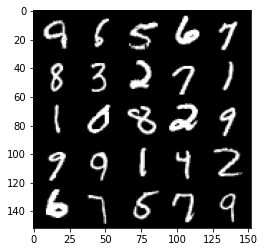

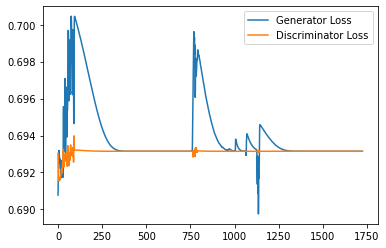

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 0.6931473004817963, discriminator loss: 0.6931471824645996


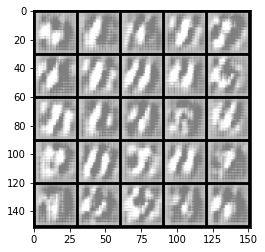

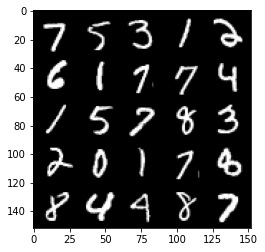

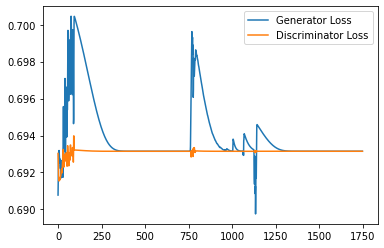

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 0.6931472611427307, discriminator loss: 0.6931471824645996


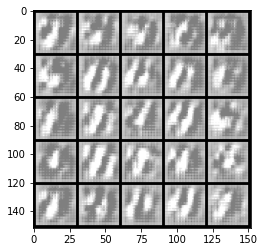

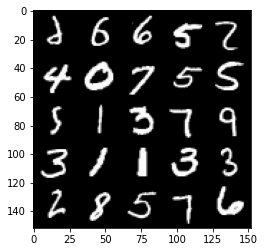

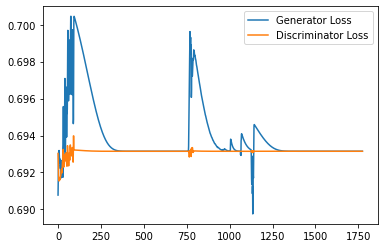

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 0.6934105736017228, discriminator loss: 0.6931233203411102


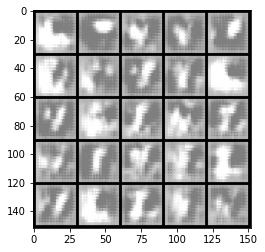

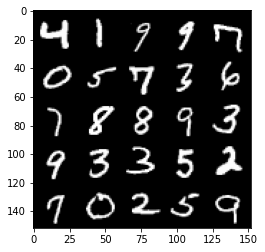

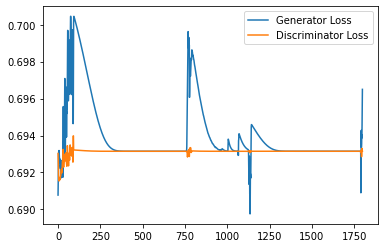

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 0.6976768718957901, discriminator loss: 0.6931474379301071


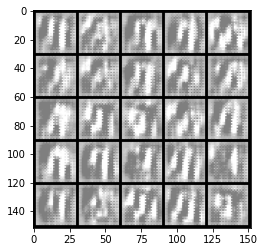

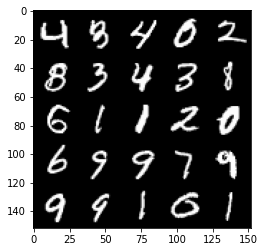

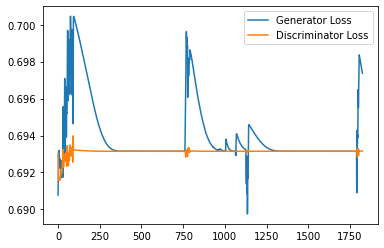

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 0.6967152626514435, discriminator loss: 0.6931542817354203


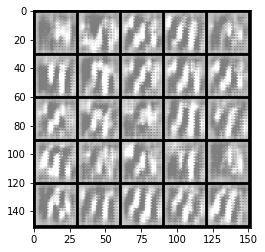

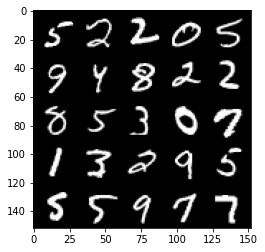

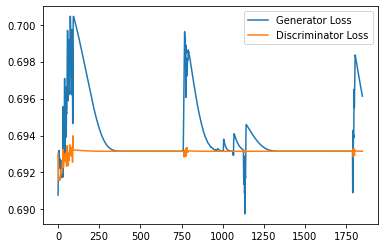

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 0.6955535265207291, discriminator loss: 0.6931504801511764


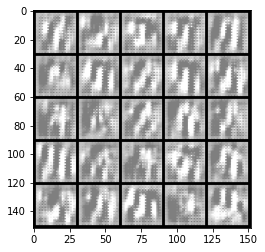

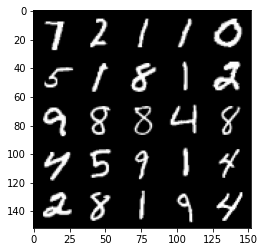

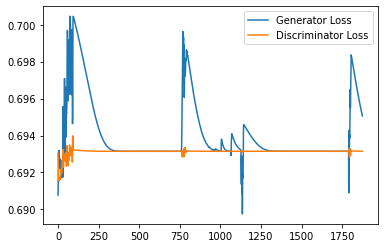

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 0.6946007442474366, discriminator loss: 0.6931484217643737


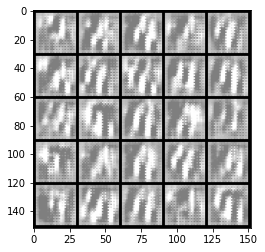

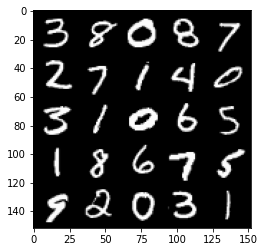

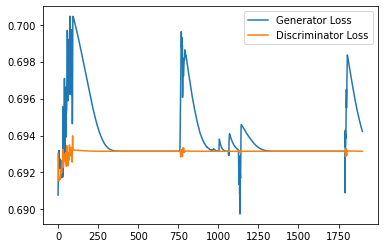

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 0.6939363167285919, discriminator loss: 0.693147546172142


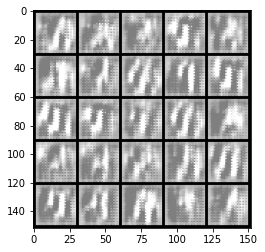

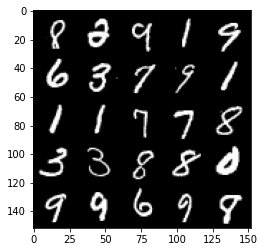

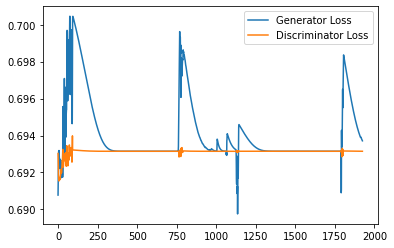

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 0.6935135099887848, discriminator loss: 0.6931472564935685


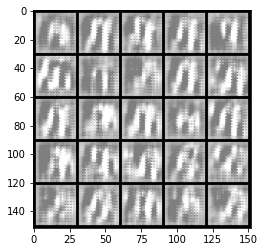

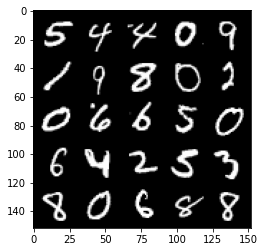

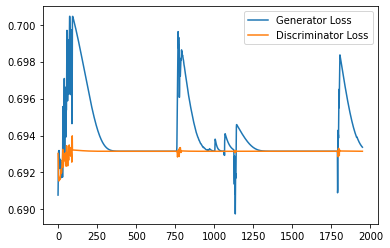

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 0.6932745274305344, discriminator loss: 0.6931471906900406


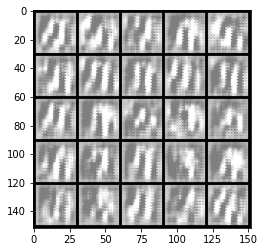

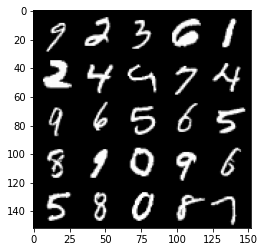

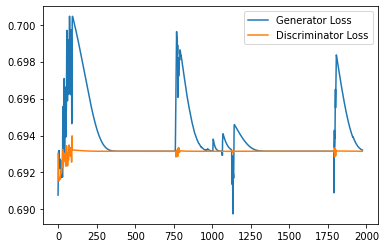

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 0.6931878577470779, discriminator loss: 0.6931471841335297


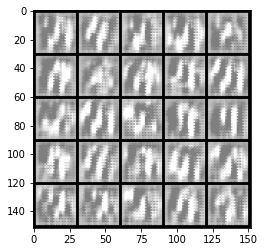

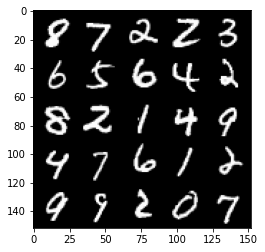

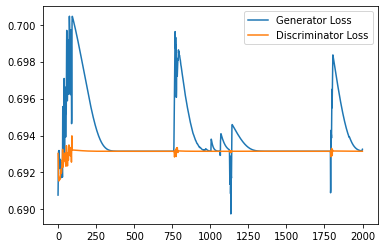

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 0.6931954053640366, discriminator loss: 0.6931471840143204


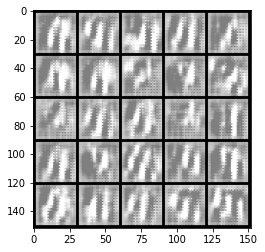

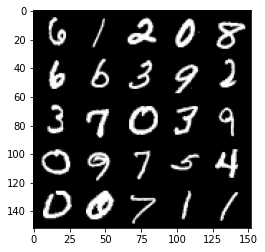

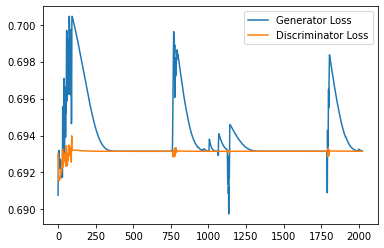

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 0.6931523492336273, discriminator loss: 0.6931471816301346


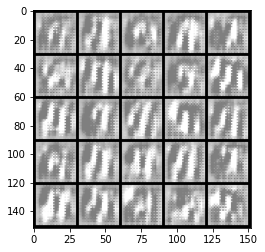

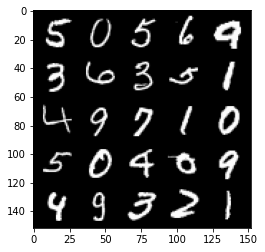

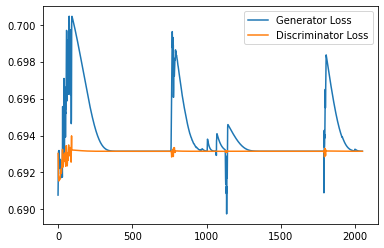

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 0.6931476211547851, discriminator loss: 0.693147183060646


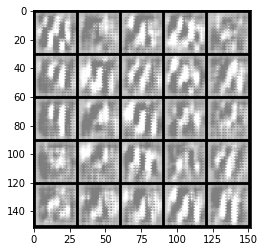

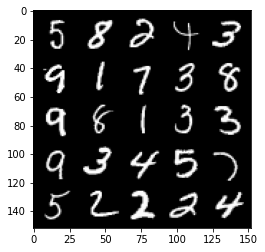

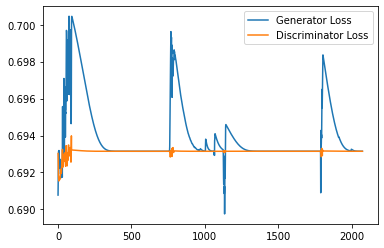

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 0.6931475402116776, discriminator loss: 0.6931471846103668


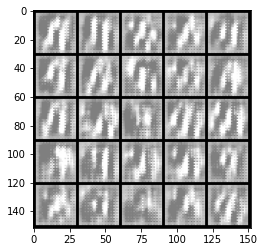

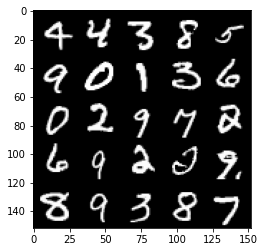

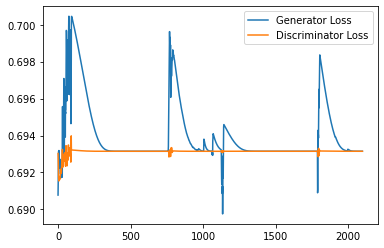

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 0.6931475398540496, discriminator loss: 0.6931472170352936


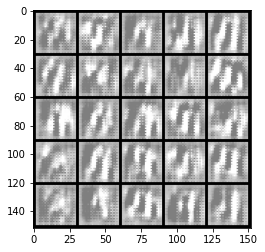

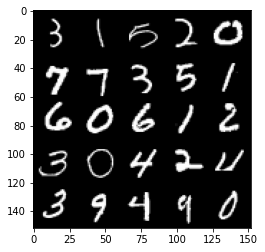

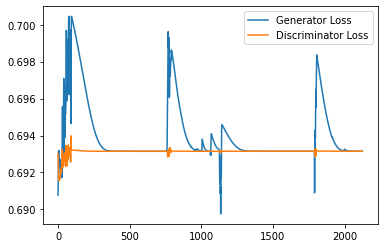

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 0.6931475402116776, discriminator loss: 0.6931472109556198


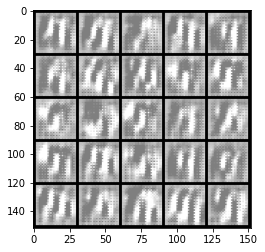

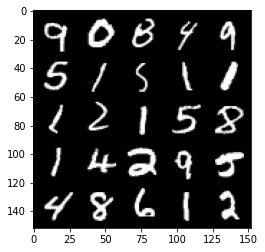

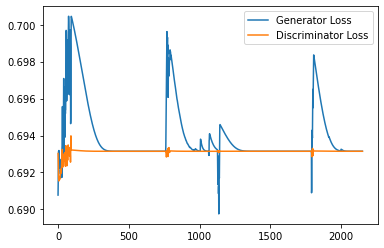

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 0.6931475220918656, discriminator loss: 0.693147227525711


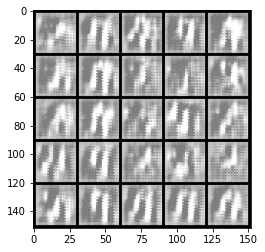

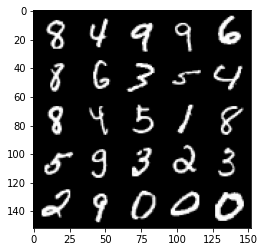

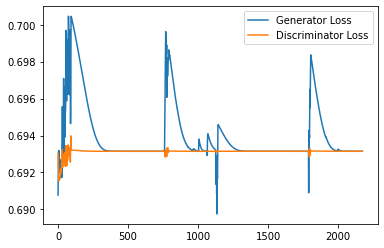

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 0.6931475104093552, discriminator loss: 0.6931472243070602


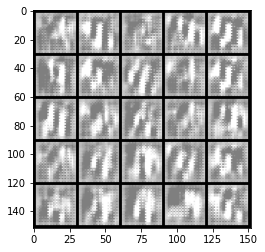

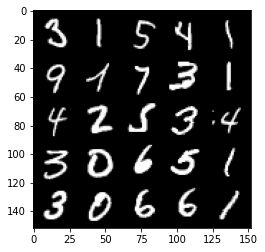

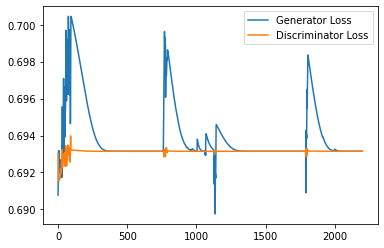

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 0.6931474709510803, discriminator loss: 0.6931472036838532


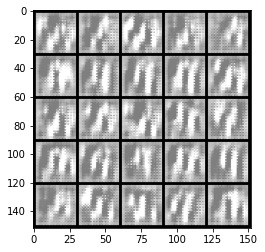

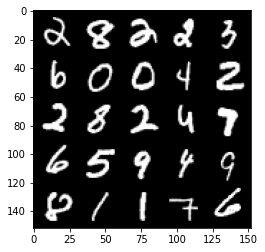

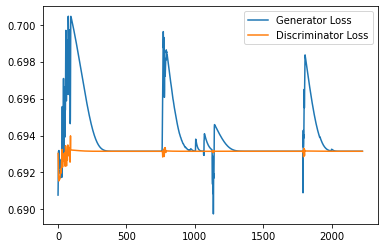

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 0.6931474212408065, discriminator loss: 0.6931471821069718


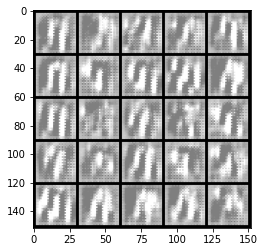

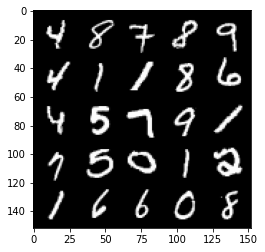

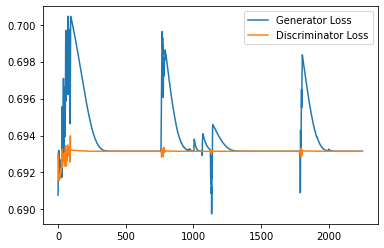

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 0.693147420167923, discriminator loss: 0.6931471824645996


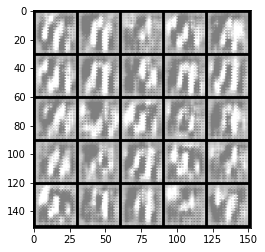

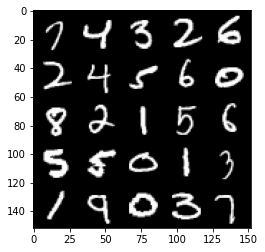

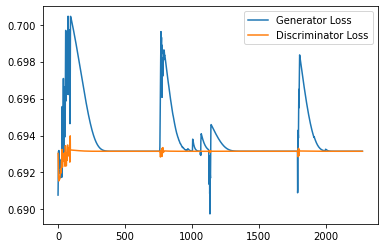

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 0.6931473506689072, discriminator loss: 0.6931471617221833


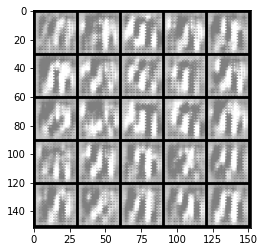

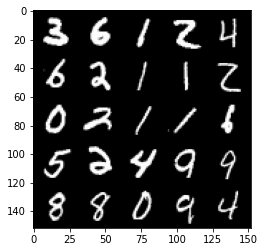

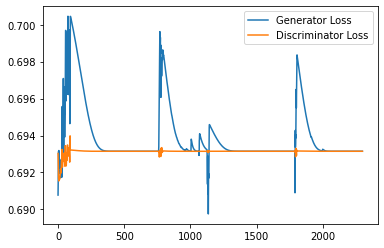

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 0.6931473258733749, discriminator loss: 0.6931471763849258


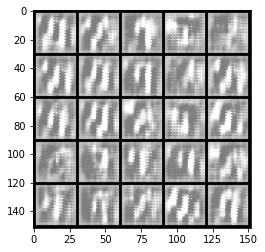

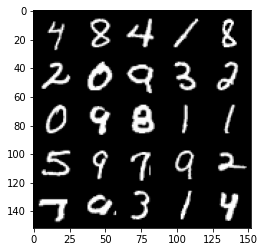

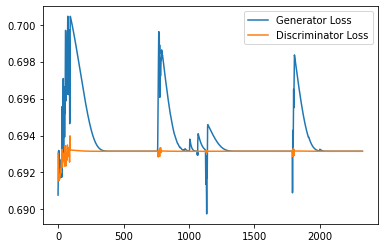

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 0.6931473039388657, discriminator loss: 0.6931471824645996


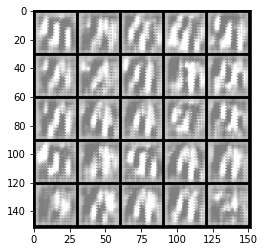

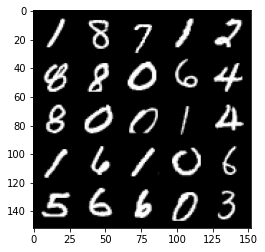

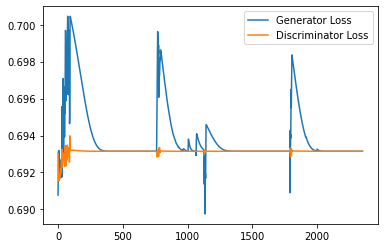

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 0.6931472986936569, discriminator loss: 0.6931471824645996


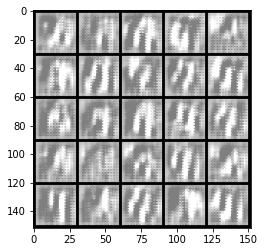

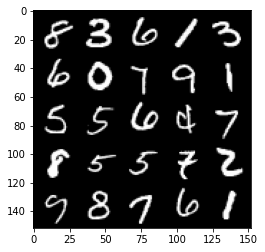

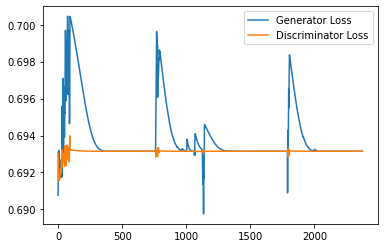

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 0.6931472754478455, discriminator loss: 0.6931471824645996


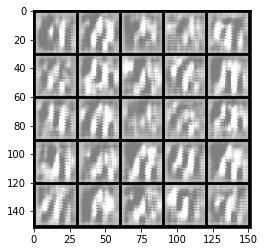

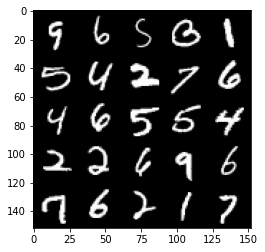

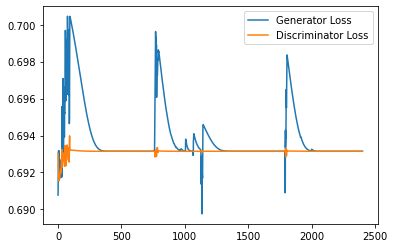

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 0.6922654397487641, discriminator loss: 0.6931469253301621


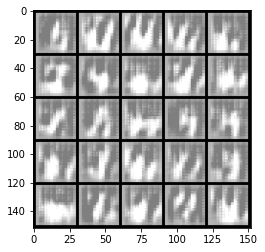

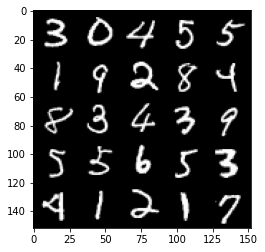

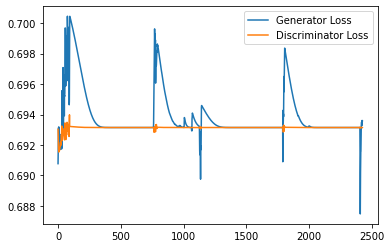

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 0.6935005135536194, discriminator loss: 0.6931472463607788


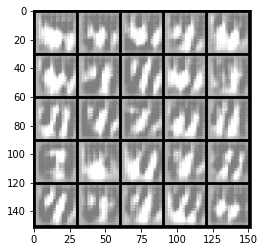

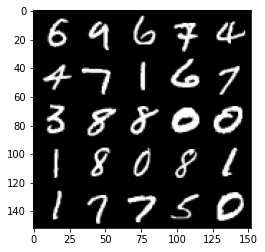

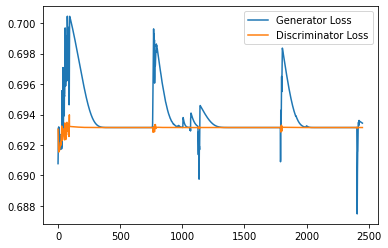

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 0.6933730667829514, discriminator loss: 0.6931472070217133


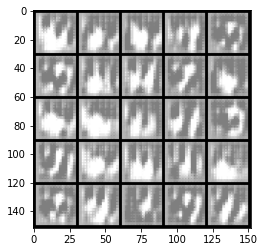

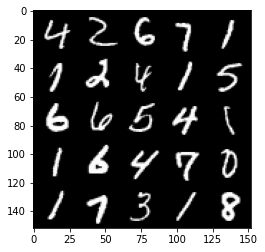

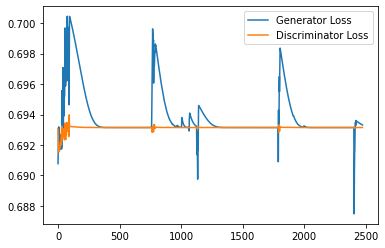

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 0.6932743626832962, discriminator loss: 0.6931471908092499


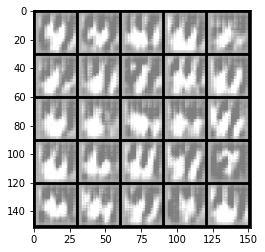

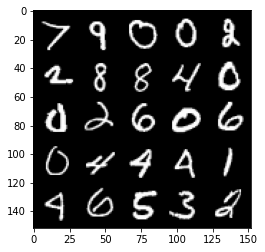

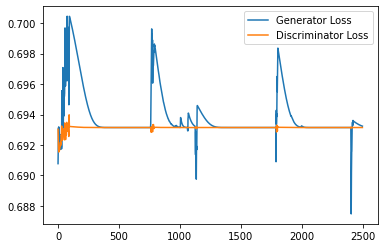

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 0.6932080101966858, discriminator loss: 0.6931471847295761


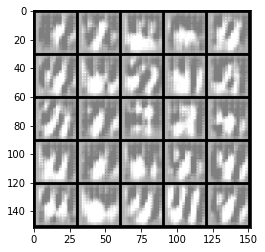

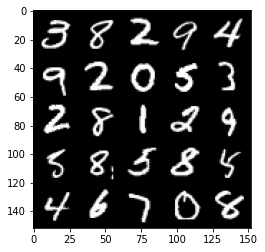

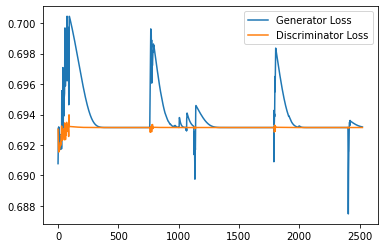

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 0.6931707893610001, discriminator loss: 0.6931471831798554


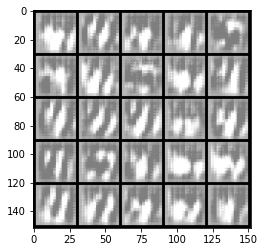

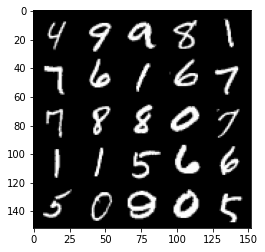

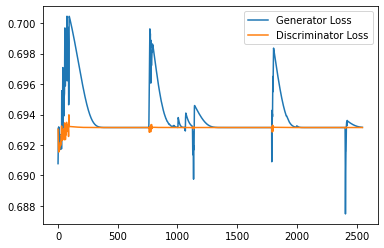

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 0.6931542481184005, discriminator loss: 0.6931471824645996


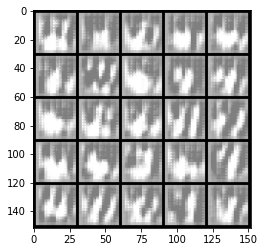

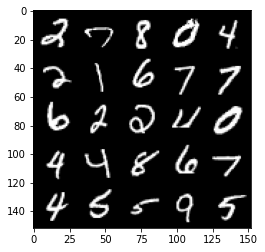

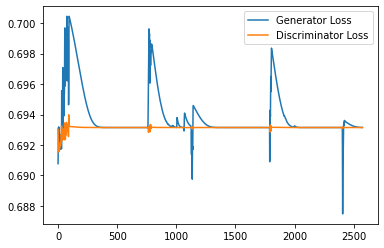

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 0.6931484423875809, discriminator loss: 0.6931471844911575


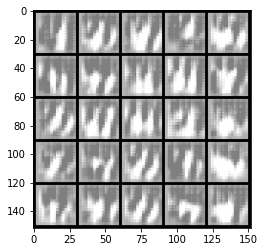

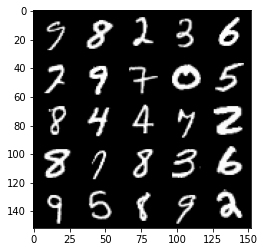

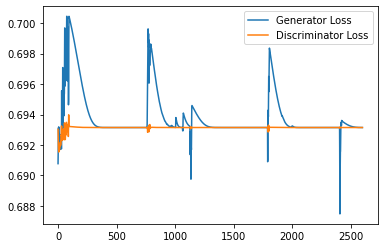

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 0.6931475876569748, discriminator loss: 0.6931471824645996


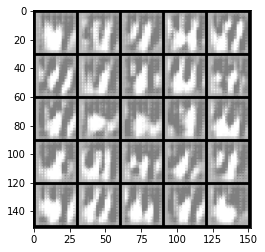

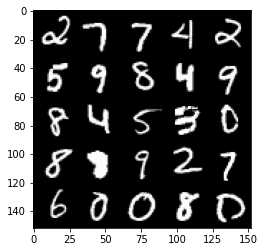

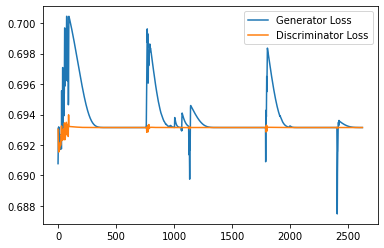

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 0.6931475400924683, discriminator loss: 0.6931471934318543


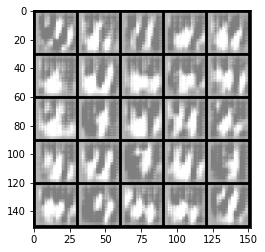

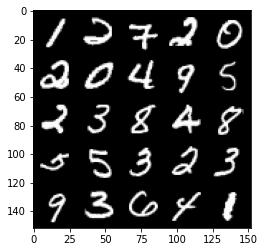

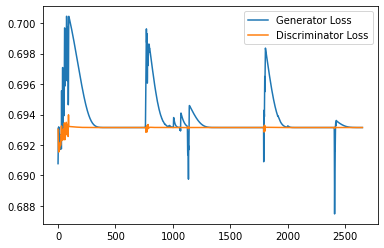

In [ ]:
current_step = 0
gen_loss = []
disc_loss = []
noise_and_labels = False
fake = False
fake_img_labels = False
real_img_labels = False
disc_fake_pred = False
disc_real_pred = False

# Define the error function
criterion = nn.BCEWithLogitsLoss()

# Save the model state every 5 epochs
save_interval = 5

# Training Loop
for epoch in range(epochs):
    
    # Returns batches and labels and flatten the batch of real imgs from the dataset
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        one_hot_labels = get_one_hot_vectors(labels.to(device), classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        # Discriminator Upgrade 
        disc_opt.zero_grad() 
        # Zero out the gradients and get the noise vector of the corresponding batch size
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        # Concatenate noise vectors and one hot vectors & generate the fake conditioned img
        noise_and_labels = torch.cat((fake_noise, one_hot_labels), dim=1)
        fake = gen(noise_and_labels)
        
        assert len(fake) == len(real)
        
        # Predictions
        # Concatenate one hot vectors with fake images 
        fake_img_labels = add_vec(fake.detach(), image_one_hot_labels) # Detach is used to detach the gen 
        # Concatenate one hot vectors with real images
        real_img_labels = add_vec(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_img_labels)
        disc_real_pred = disc(real_img_labels)
        
        assert len(disc_real_pred) == len(real)
        assert torch.any(fake_img_labels != real_img_labels)

        # Compute discriminator loss and perform backpropagation 
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss_avg = (disc_fake_loss + disc_real_loss) / 2
        disc_loss_avg.backward(retain_graph=True)
        disc_opt.step() 

        disc_loss += [disc_loss_avg.item()]

        # Compute generator loss
        gen_optim.zero_grad() # Zero out the gradients
        fake_img_labels = add_vec(fake, image_one_hot_labels)
        disc_fake_pred = disc(fake_img_labels)
        gen_loss_avg = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss_avg.backward() # Perform backpropagation only to update parameters
        gen_optim.step()
        gen_loss += [gen_loss_avg.item()]
        
        # Plotting real and fake imgs
        if current_step % step == 0 and current_step > 0:
            gen_mean = sum(gen_loss[-step:]) / step
            disc_mean = sum(disc_loss[-step:]) / step
            print(f"Step {current_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            plot_imgs(fake)
            plot_imgs(real)

            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(gen_loss) // step_bins)] * step_bins)
            num_examples = (len(gen_loss) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(gen_loss[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(disc_loss[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()

        # Save the generator and discriminator states every 5 epochs
        #if epoch % save_interval == 0:
          #checkpoint_path_gen = checkpoint_dir_gen + 'Gen_epoch{}.pth'.format(epoch)
          #torch.save(gen.state_dict(), checkpoint_path_gen)
          #checkpoint_path_disc = checkpoint_dir_disc + 'Disc_epoch{}.pth'.format(epoch)
          #torch.save(disc.state_dict(), checkpoint_path_disc)

        current_step += 1


The generator and discriminator models are taking too long to converge. This training instability might be due to discriminator network which becomes too good at distinguishing between real and fake data, making it difficult for the generator to improve. In hopes of overcoming this, I tried to modify the architecture a little bit and tried playing with the hyperparameters, but I was not successful in speeding up the generator's convergence. I trained this for around 10 hours on Google Colab with GPU for 100 epochs and obtained the above results. I think that given access to better runtimes and more number of epochs (~ 500), the model will converge.

References that I used for coding - 
1. https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-an-mnist-handwritten-digits-from-scratch-in-keras/ 
2. https://github.com/Sachin-Wani/deeplearning.ai-GANs-Specialization 